In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression

C:\Users\KVBA\Anaconda3\lib\site-packages\scipy\__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "


## Deviations

In [2]:
dev = pd.read_csv("deviations.csv", parse_dates=[4,5])
dev = dev[["dept_time", "arr_time", "src_deviations", "dest_deviations", "direction"]]
dev[["src_deviations", "dest_deviations"]] = dev[["src_deviations", "dest_deviations"]]/1000
print(dev.shape)
print(dev.info())
dev.sample(5)

(2741, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2741 entries, 0 to 2740
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   dept_time        2741 non-null   datetime64[ns]
 1   arr_time         2741 non-null   datetime64[ns]
 2   src_deviations   2741 non-null   float64       
 3   dest_deviations  2741 non-null   float64       
 4   direction        2741 non-null   object        
dtypes: datetime64[ns](2), float64(2), object(1)
memory usage: 107.2+ KB
None


,dept_time,arr_time,src_deviations,dest_deviations,direction
1193,2019-01-25 09:50:32,2019-01-25 10:27:55,1.438270,2.569136,east going
1387,2019-01-09 10:23:12,2019-01-09 11:14:33,-1.971656,-1.914429,west_going
800,2019-01-30 11:17:53,2019-01-30 12:13:12,2.805651,1.358863,east going
2534,2019-01-12 20:07:52,2019-01-12 20:46:41,-0.931229,-0.729017,west_going
2677,2019-01-03 18:08:33,2019-01-03 18:50:43,0.297901,0.377639,east going


**Note**: The deviations are given in kilometers

# Simulating without correlation

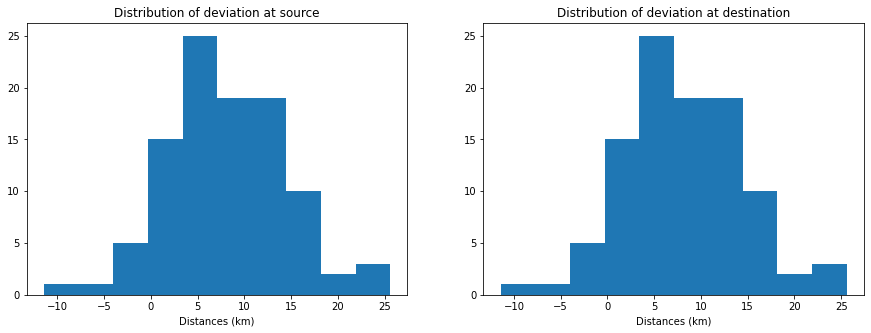

In [3]:
%matplotlib inline

xs = np.random.normal(loc=3, scale=3, size=2000)
ys = np.random.normal(loc=2, scale=4, size=2000)


fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2, figsize=(15,5))

src_points = np.random.normal(loc=8, scale=7, size=100)
ax1.hist(src_points)
ax1.set_xlabel("Distances (km)")
ax1.set_title("Distribution of deviation at source")

dest_points = np.random.normal(loc=8, scale=7, size=100)
ax2.hist(src_points)
ax2.set_xlabel("Distances (km)")
ax2.set_title("Distribution of deviation at destination")
plt.show()

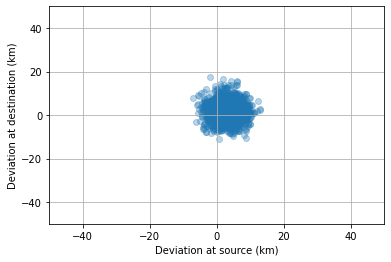

In [4]:
plt.scatter(xs,ys, alpha=0.3)
plt.xlabel("Deviation at source (km)")
plt.ylabel("Deviation at destination (km)")
plt.ylim(-50,50)
plt.xlim(-50,50)
plt.grid()
plt.show()

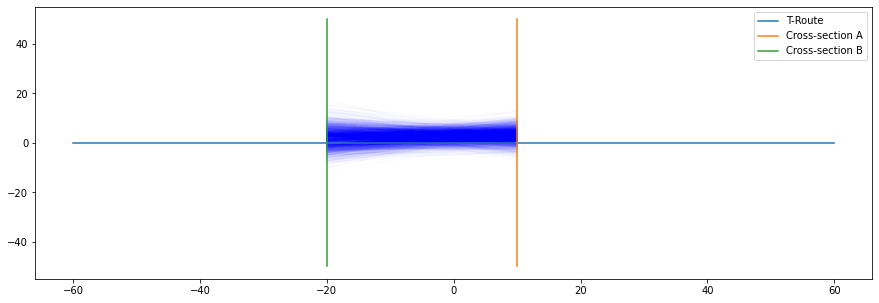

In [5]:
plt.figure(figsize=(15,5))
for x,y in zip(xs,ys):
    plt.plot((10, -20),(x,y), alpha=0.01, color='blue')
    
plt.plot((60,-60),(0,0), label="T-Route")
plt.plot((10,10),(50,-50), label="Cross-section A")
plt.plot((-20,-20),(-50,50), label="Cross-section B")
plt.legend()
plt.show()

## Creating the animation of the simulation

In [6]:
fig, ax = plt.subplots(figsize=(15,10))

# x_data = []
# y_data = []

def init():
    ax.plot((60,-60),(0,0), label="T-Route")
    ax.plot((10,10),(30,-30), label="Cross-section A")
    ax.plot((-20,-20),(-30,30), label="Cross-section B")
    
    ax.set_xlim(-70,70)
    ax.set_ylim(-50,50)
    route, = ax.plot([],[], color='blue')
    fig.suptitle("Simulation of ships in the T-route", fontsize=25, fontweight=10)
    ax.legend()
    
    ax.set_xlabel("Deviation at source (km)")
    ax.set_ylabel("Deviation at destination (km)")
    return ax


def update(i):
    i = int(i)
    d_src, d_dest = xs[i], ys[i]
    ax.plot((10, -20),(d_src,d_dest), color='blue', alpha=0.1)
    ax.set_title(("Total trips: %d" % i))
    return ax
    

ani = FuncAnimation(fig, update, frames=np.arange(0, 100, 1), init_func=init, interval=200)
plt.close()
HTML(ani.to_jshtml())

# Simulating with correlation

Considering correlation between the source deviation and destination deviations

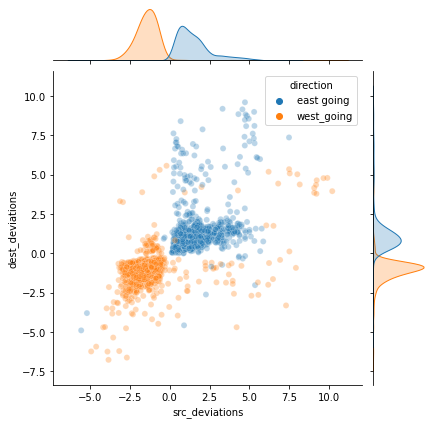

In [7]:
sns.jointplot(x="src_deviations", y="dest_deviations", data=dev, hue="direction", alpha=0.3)
plt.show()

## Fitting polynomial model

### Preprocessing the data

In [8]:
X = dev["src_deviations"].values.reshape(-1,1)
Y = dev["dest_deviations"].values
print(X.shape, Y.shape)

(2741, 1) (2741,)


In [9]:
poly = PolynomialFeatures(degree=2)
x_features = poly.fit_transform(X)
x_features

array([[ 1.        ,  0.67321168,  0.45321397],
       [ 1.        , -2.38894984,  5.70708134],
       [ 1.        ,  1.82421353,  3.32775501],
       ...,
       [ 1.        ,  2.32806334,  5.41987891],
       [ 1.        , -2.10981879,  4.45133534],
       [ 1.        ,  0.33187145,  0.11013866]])

In [10]:
model = LinearRegression()
model.fit(x_features, Y)

LinearRegression()

### Visualization of the model

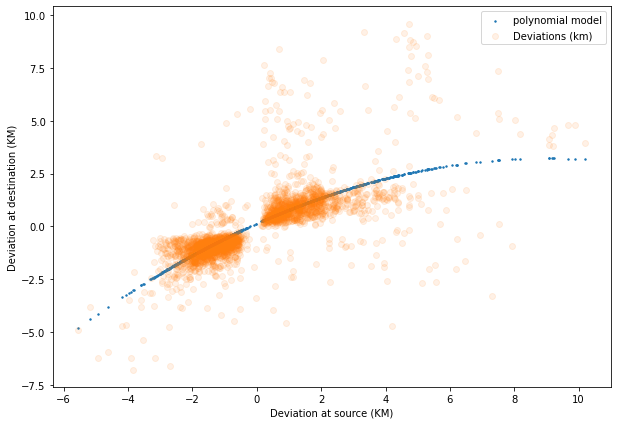

In [11]:
y_pred = model.predict(x_features)
plt.figure(figsize=(10,7))
plt.scatter(X, y_pred, s=2, label='polynomial model')
plt.scatter(dev["src_deviations"], dev["dest_deviations"], alpha=0.1, label="Deviations (km)")
plt.xlabel("Deviation at source (KM)")
plt.ylabel("Deviation at destination (KM)")
plt.legend()
plt.show()

## Simulation

In [12]:
poly_xs = poly.transform(xs.reshape(-1,1))
poly_ys = model.predict(poly_xs)
poly_ys

array([ 0.6139896 ,  1.27080403, -0.06141495, ...,  0.94119959,
        0.27521409, -0.82049104])

In [13]:
fig, ax = plt.subplots(figsize=(15,10))

x_data = []
y_data = []

def init():
    ax.plot((60,-60),(0,0), label="T-Route")
    ax.plot((10,10),(30,-30), label="Cross-section A")
    ax.plot((-20,-20),(-30,30), label="Cross-section B")
    
    ax.set_xlim(-70,70)
    ax.set_ylim(-50,50)
    route, = ax.plot([],[], color='blue')
    fig.suptitle("Simulation of ships in the T-route", fontsize=25, fontweight=10)
    ax.legend()
    
    ax.set_xlabel("Deviation at source (km)")
    ax.set_ylabel("Deviation at destination (km)")
    return ax


def update(i):
    i = int(i)
    d_src, d_dest = xs[i], poly_ys[i]
    ax.plot((10, -20),(d_src,d_dest), color='blue', alpha=0.1)
    ax.set_title(("Total trips: %d" % i))
    return ax
    

ani = FuncAnimation(fig, update, frames=np.arange(0, 300, 1), init_func=init, interval=100)
plt.close()
HTML(ani.to_jshtml())